In [2]:
# Analysis
import os
import glob
import numpy as np
import pandas as pd
import scipy

# Plotting
import PIL
from PIL import ImageDraw, Image
import seaborn as sns
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['font.sans-serif']=['Arial Unicode MS'] 
plt.rcParams['axes.unicode_minus']=False 

# Framework
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers

>### GradCAM

GradCAMs combines CAM and Saliency map, and uses gradients instead of the GAP weights to weight the activations, and therefore is a gradient-weighted class activation map.

In [212]:
from tensorflow.keras.applications.vgg16 import VGG16
import tensorflow.keras.backend as K

#### Data

In [5]:
(train, validation, test), info = tfds.load('cats_vs_dogs', with_info=True, as_supervised=True, 
                         split = ['train[:80%]', 'train[80%:90%]', 'train[90%:]'])
train
validation
test

Shuffling and writing examples to /root/tensorflow_datasets/cats_vs_dogs/4.0.0.incompleteY3AYEE/cats_vs_dogs-train.tfrecord


Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>

In [6]:
n_samples = info.splits['train'].num_examples
n_classes = info.features['label'].num_classes
print(n_samples)
print(n_classes)

23262
2


In [7]:
def preprocess(images, labels): 
    images = tf.cast(images, tf.float32) 
    images = tf.image.resize(images, (224, 224)) 
    images = images/255.0 
    return images, labels

In [8]:
AUTO = tf.data.experimental.AUTOTUNE
def prepare_train_dataset(train):
    train = (train
             .map(preprocess)
             .shuffle(BUFFER_SIZE) 
             .batch(BATCH_SIZE) 
             .prefetch(AUTO)) 
    return train

def prepare_test_dataset(test):
    test = (test
            .map(preprocess) 
            .batch(BATCH_SIZE))
    return test

In [9]:
BATCH_SIZE = 32
BUFFER_SIZE = n_samples//4
class_names = ['cat', 'dog']

In [10]:
train = prepare_train_dataset(train)
validation = prepare_test_dataset(validation)
test = prepare_test_dataset(test)
train
test

<PrefetchDataset shapes: ((None, 224, 224, 3), (None,)), types: (tf.float32, tf.int64)>

<BatchDataset shapes: ((None, 224, 224, 3), (None,)), types: (tf.float32, tf.int64)>

#### Model
Use pre-trained VGG16 with customized classifier. 

In [11]:
vgg16 = VGG16(input_shape=(224,224,3), weights='imagenet', include_top=False)
for layer in vgg16.layers[:-4]: #后4层可train
        layer.trainable=False
        
x = layers.GlobalAveragePooling2D()(vgg16.output)
x = layers.Dense(2, activation='softmax')(x)
model = keras.Model(vgg16.input, x)
model.summary()

58892288/58889256 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
______________________________________________________________

In [13]:
model.compile(loss='sparse_categorical_crossentropy', metrics=['accuracy'], #实际label为数字
              optimizer=keras.optimizers.RMSprop(0.001))
history = model.fit(train, epochs=3, validation_data=validation)

Epoch 1/3
582/582 [==============================] - 212s 336ms/step - loss: 2.9871 - accuracy: 0.8276 - val_loss: 0.1566 - val_accuracy: 0.9411
Epoch 2/3
582/582 [==============================] - 194s 312ms/step - loss: 0.1825 - accuracy: 0.9392 - val_loss: 0.1344 - val_accuracy: 0.9514
Epoch 3/3
582/582 [==============================] - 193s 312ms/step - loss: 0.1344 - accuracy: 0.9532 - val_loss: 0.1273 - val_accuracy: 0.9583


#### GradCam

In [19]:
# 选择想要可视化的所有层，这里选所有vgg conv层
convs = [layer.output for layer in model.layers[1:18]]
layer_names = [layer.name.split("/")[0] for layer in model.layers[1:18]]
layer_names

#建立gradcam模型，同时输出所有Conv层
gradcam = keras.Model(model.input, convs) 

['block1_conv1',
 'block1_conv2',
 'block1_pool',
 'block2_conv1',
 'block2_conv2',
 'block2_pool',
 'block3_conv1',
 'block3_conv2',
 'block3_conv3',
 'block3_pool',
 'block4_conv1',
 'block4_conv2',
 'block4_conv3',
 'block4_pool',
 'block5_conv1',
 'block5_conv2',
 'block5_conv3']

In [88]:
# gradcam显示class认为哪些features能学到最多，以及每个pixel基于其包含的features分布，综合平均下来最值得学习
def get_grads(image, y_true, layer_name='block5_conv3', smoothing_factor=1e-5):
    # 创建指定层的模型，输出该层Conv和最终output
    layer_gradcam = keras.Model(model.input, 
                       [model.get_layer(layer_name).output, model.output])
    
    with tf.GradientTape() as tape:
        layer_output, y_pred = layer_gradcam(image) #(1,14,14,512)
        tape.watch(layer_output)
        # loss方法一
        #loss = keras.losses.sparse_categorical_crossentropy(y_true, y_pred) 
        
        # loss方法二：手动binary log loss
        y_pred = y_pred[:,1] #class=1狗的概率，
        y_true = tf.cast(y_true, dtype=tf.float32) #把label 0/1转成float
        loss = -1*(y_true*tf.math.log(y_pred+smoothing_factor) + (1-y_true)*tf.math.log(1-y_pred+smoothing_factor))

    gradients = tape.gradient(loss, layer_output) #(1,14,14,512)
    #类似GAP把(w,h)求平均，从上一层(1,14,14,512)浓缩到(512,)，gradient总和代表每个feature值得学习的程度
    gradients = K.mean(gradients, axis=(0,1,2))  
    gradients = gradients.numpy()
    layer_output = np.squeeze(layer_output.numpy()) #(14,14,512)
    for i in range(layer_output.shape[-1]): #遍历每个feature的总gradient
        layer_output[:,:,i] *= gradients[i] #(14,14,512)
    heatmap = np.mean(layer_output, axis=-1) #(14,14) 比起cam的@点积求和，这里求均值
    heatmap = np.maximum(heatmap, 0) #保证所有值>0
    heatmap /= heatmap.max() #normalize [0,1]
    
    del layer_gradcam, layer_output, gradients, loss #清内存
    return heatmap

In [90]:
def plot_gradcam(data, layer_name='block5_conv3'):
    for images, y_true in data.shuffle(BUFFER_SIZE).take(1): #batch
        image_i = np.random.choice(BATCH_SIZE)
        image = images[image_i][np.newaxis,...] #(1,224,224,3)
        y_true = y_true[image_i] 
        y_pred_label = np.argmax(model.predict(image), axis=-1)[0] #预测label

        f,ax = plt.subplots(2,2, figsize=(10,8))

        # 图一：原图
        ax[0,0].imshow(image[0]) #[0,1]
        ax[0,0].set_title(f"Predicted: {y_pred_label}, True: {y_true}")
        ax[0,0].axis('off')

        # 图二：随机conv层
        convs = gradcam.predict(image) #输出所有Conv层
        conv_i = np.random.choice(2) #这里考虑到可比性，随机选择前两层Conv和原图wh一样
        filter_i = np.random.choice(64) #filter数最少为64，防止超过
        conv = convs[conv_i][0,:,:,filter_i] #随机层conv(1,224,224,64)->(224,224)的第i个filter
        conv = (conv-conv.mean())/conv.std() #normalize[0,1]
        conv = conv*255 #[0,255]
        conv = np.clip(conv, 0, 255).astype(np.uint8) #保证取值范围
        ax[0,1].imshow(conv)
        ax[0,1].set_title("Random feature map")
        ax[0,1].axis('off')

        # 图三：最后一层conv的gradcam
        heatmap = get_grads(image, y_true, layer_name=layer_name)
        heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[2]))
        heatmap = heatmap*255 #[0,255]
        heatmap = np.clip(heatmap, 0, 255).astype(np.uint8) #保证取值范围
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_HOT) #利用cv2给分配颜色
        ax[1,0].imshow(heatmap, cmap='gray')
        ax[1,0].set_title("Grad Class Activation Map")
        ax[1,0].axis('off')
    
        # 图四：混合原图和gradcam
        superimposed = cv2.addWeighted(src1=image[0].numpy(), alpha=0.5, 
                                       src2=heatmap.astype('float32')/255, beta=0.5,
                                       gamma=0.0)
        ax[1,1].imshow(superimposed)
        ax[1,1].set_title("Superimposed GradCAM")
        ax[1,1].axis('off')
        plt.tight_layout()
        plt.show()
        
        return convs

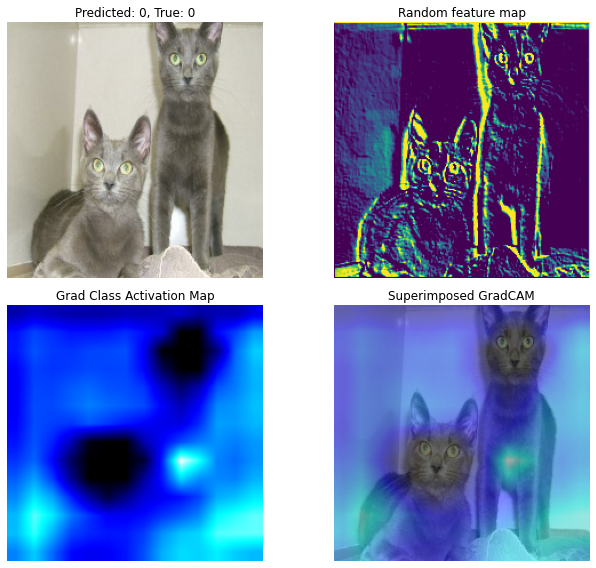

In [95]:
# 倒数第二层conv的gradcam，明显看到还有很多地方在学习
convs = plot_gradcam(test, layer_name='block5_conv2')

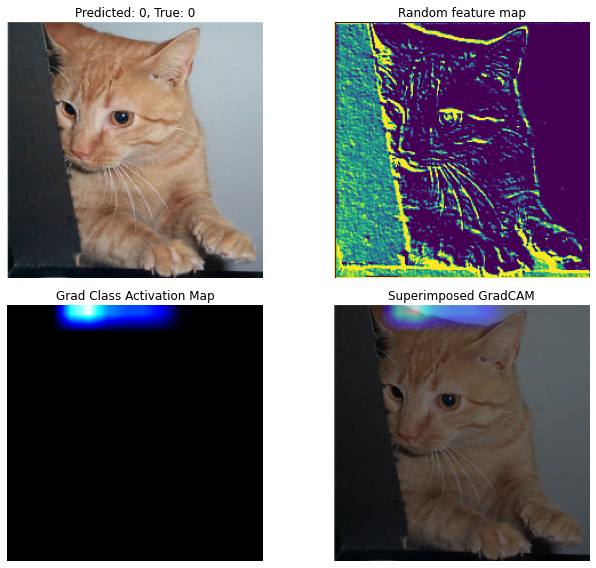

In [77]:
# 最后一层conv，只剩下最后一点东西在学习
convs = plot_gradcam(test)

In [39]:
def plot_convs(layer_names, convs):
    images_per_row=16 #正好能被64，128等整除
    
    for layer_name, layer_output in zip(layer_names, convs):
        n_filters = layer_output.shape[-1]
        size = layer_output.shape[1]

        n_rows = n_filters // images_per_row #输出每层conv的所有filters
        grid = np.zeros([size*n_rows, size*images_per_row])

        for row in range(n_rows):
            for col in range(images_per_row):
                feature_map = layer_output[0,:,:,row*images_per_row + col]
                feature_map = (feature_map-feature_map.mean())/feature_map.std() #[0,1]
                feature_map *=255 #[0,255]
                feature_map = np.clip(feature_map, 0, 255).astype(np.uint8) #保证范围
                grid[row*size:(row+1)*size, col*size:(col+1)*size] = feature_map

        #为了保证每个feature map大小都一致
        scale = 1./size 
        plt.figure(figsize=(scale*grid.shape[1], scale*grid.shape[0]))
        plt.title(layer_name, fontsize=12)
        plt.grid(False)
        plt.axis('off')
        plt.imshow(grid, aspect='auto', cmap='viridis') #viridis
    plt.show()

If you scroll all the way down to see the outputs of the final conv layer, you'll see that there are very few active features and these are mostly located in the face of the cat. This is the region of the image that your model looks at when determining the class.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


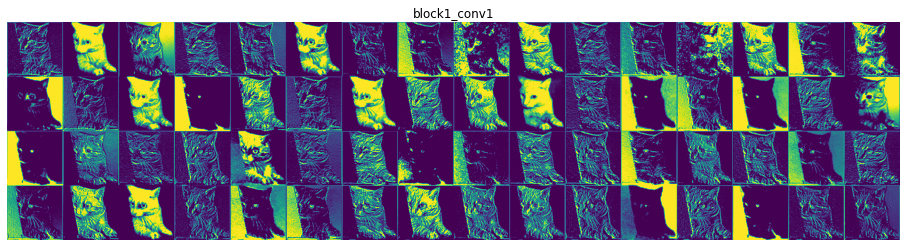

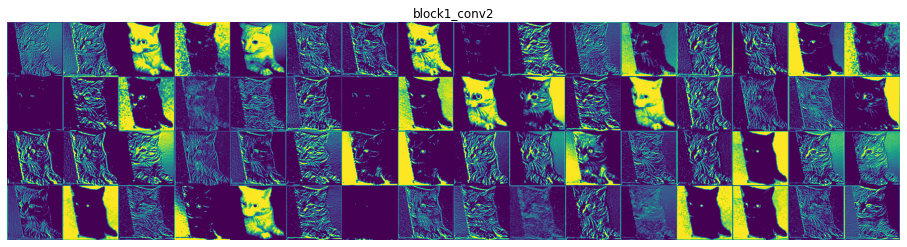

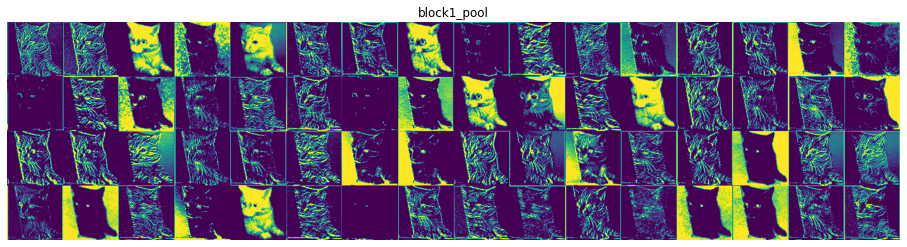

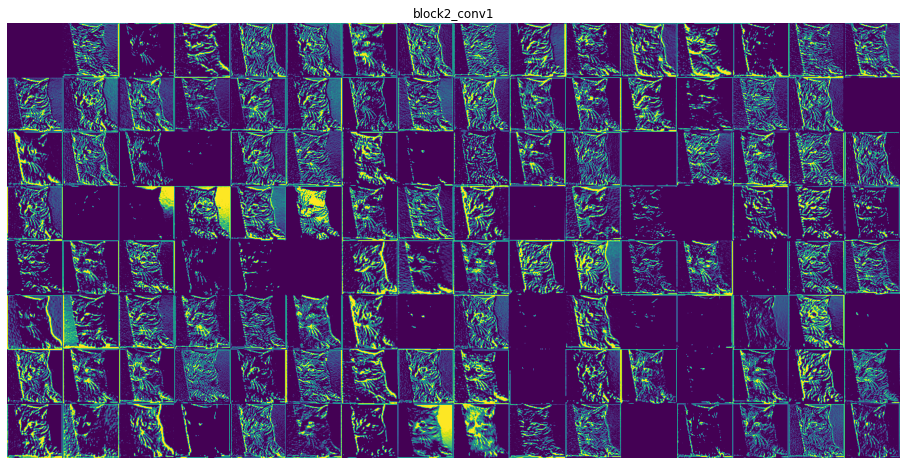

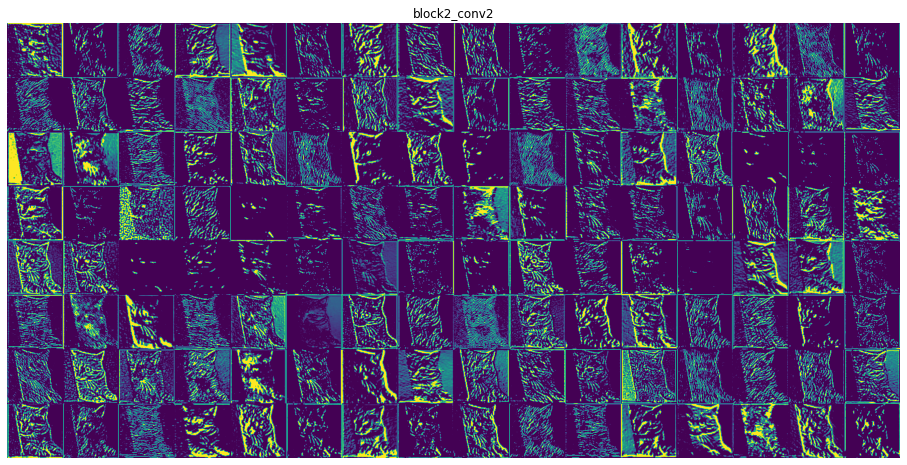

...

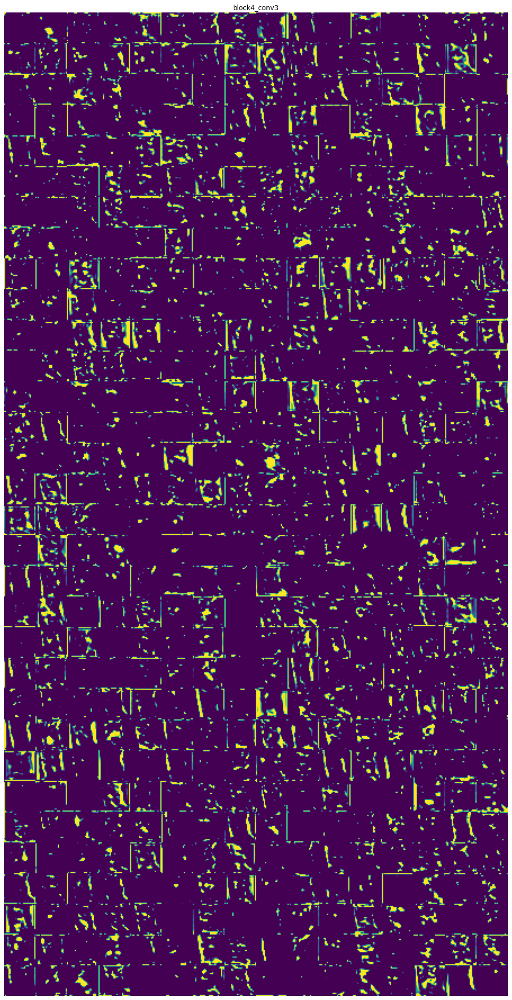

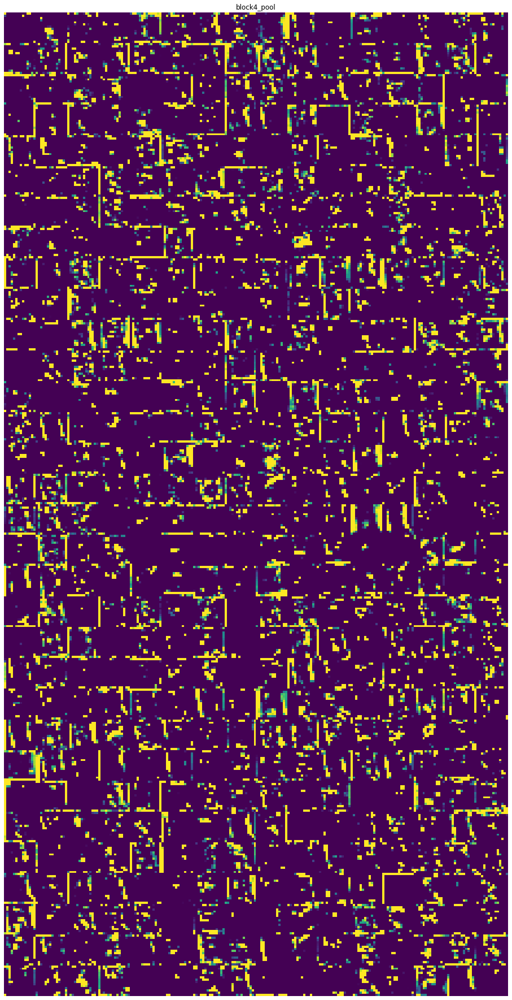

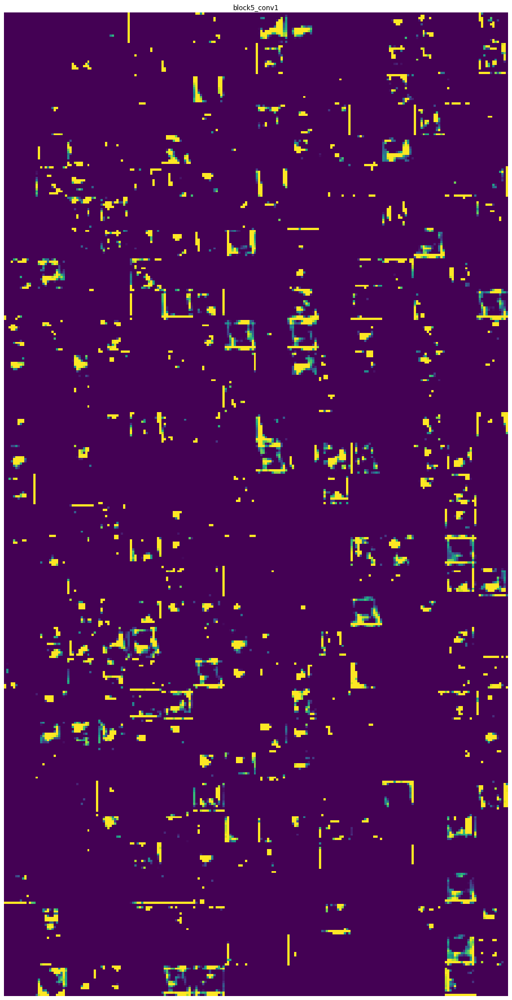

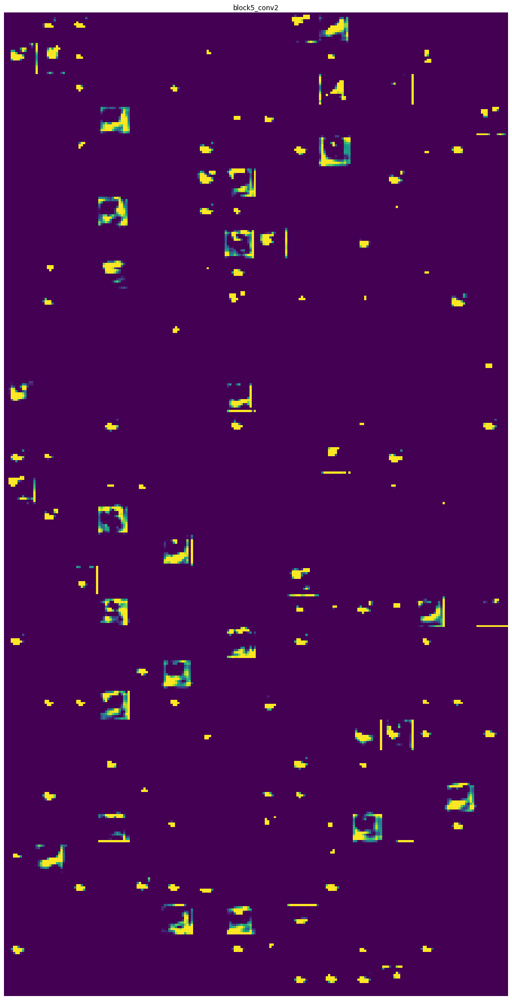

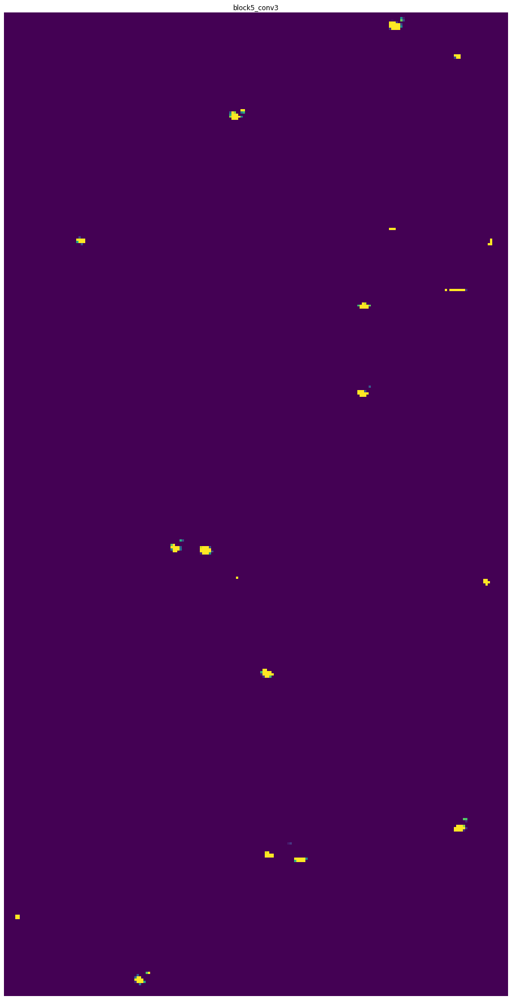

In [78]:
plot_convs(layer_names, convs)